In [1]:
import os,sys
import torch
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import json
sys.path.append('../utils')
sys.path.append('../')
import utils
from dataset.dataset_denoise import *
from model import *

/root/miniconda3/envs/Uformer/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
output_dir = '../logs/denoising/diffraction/Uformer_B_first_train'
model_name = f'{output_dir}/models/model_best.pth'
result_dir = f'{output_dir}/results/'
config_dir = f'{output_dir}/config.json'
with open(config_dir, 'r') as f:
    config = json.load(f)

model_restoration = Uformer(img_size=config['train_ps'],embed_dim=32,win_size=8,token_projection='linear',token_mlp='leff',
            depths=[1, 2, 8, 8, 2, 8, 8, 2, 1],modulator=True,dd_in=config['dd_in'])

utils.load_checkpoint(model_restoration, model_name)
model_restoration.cuda()
model_restoration.eval()

/root/Diffraction_denoising/test/../utils/model_utils.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(weights)


Uformer(
  embed_dim=32, token_projection=linear, token_mlp=leff,win_size=8
  (pos_drop): Dropout(p=0.0, inplace=False)
  (input_proj): InputProj(
    (proj): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
    )
  )
  (output_proj): OutputProj(
    (proj): Sequential(
      (0): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
  )
  (encoderlayer_0): BasicUformerLayer(
    dim=32, input_resolution=(128, 128), depth=1
    (blocks): ModuleList(
      (0): LeWinTransformerBlock(
        dim=32, input_resolution=(128, 128), num_heads=1, win_size=8, shift_size=0, mlp_ratio=4.0,modulator=None
        (norm1): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
        (attn): WindowAttention(
          dim=32, win_size=(8, 8), num_heads=1
          (qkv): LinearProjection(
            (to_q): Linear(in_features=32, out_features=32, bias=True)
            (to_kv): Linear(in_

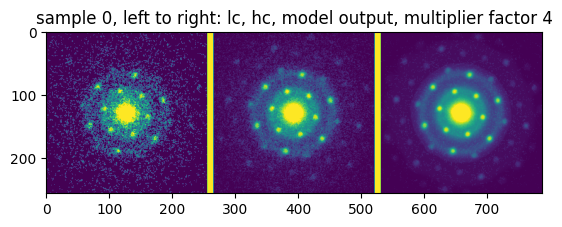

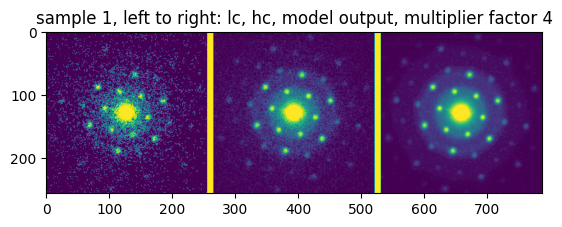

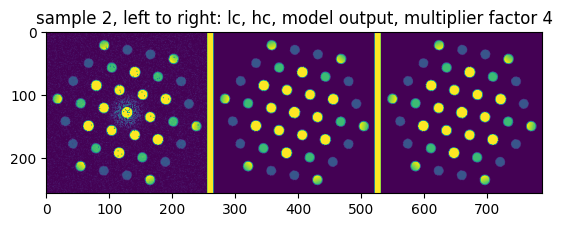

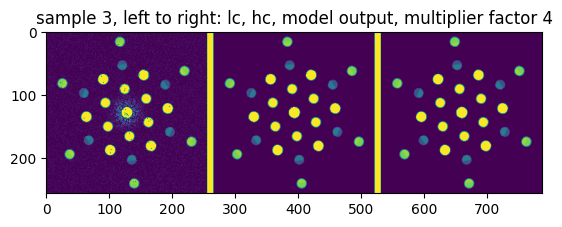

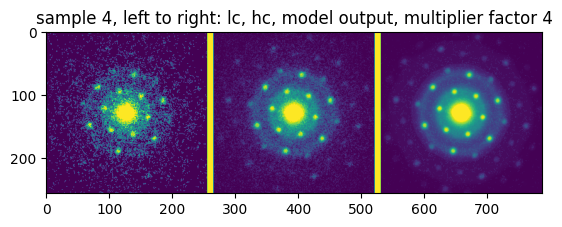

...

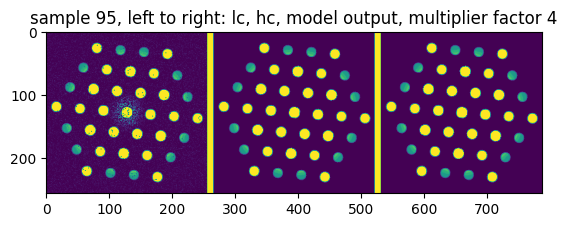

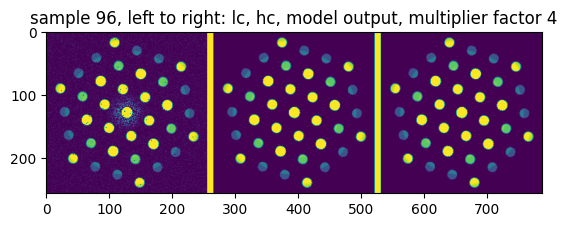

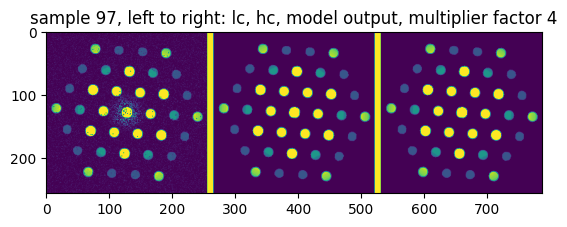

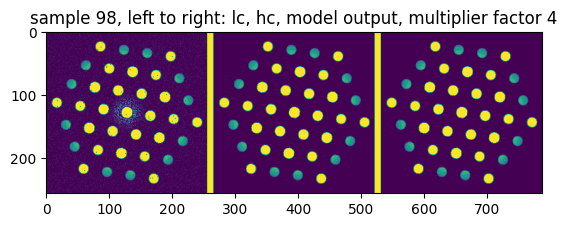

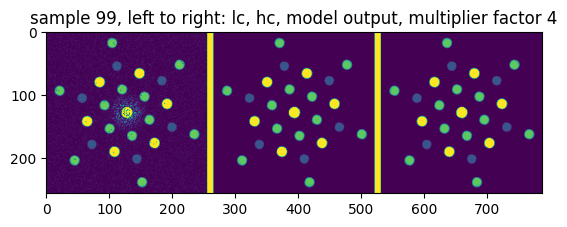

In [3]:
data_dir = f'../example_data/validation'
test_path_hc = f'{data_dir}/HC/'
test_path_lc = f'{data_dir}/LC/'
test_dataset_hc = get_test_data(test_path_hc)
test_dataset_lc = get_test_data(test_path_lc)
Nsample = len(test_dataset_lc)
factor = 4
with torch.no_grad():
    for i in range(Nsample):
        img = test_dataset_lc[i][0].reshape(1,3,256,256).to('cuda')
        out = model_restoration(img)
        out = torch.clamp(out,0,1).cpu().detach().permute(0, 2, 3, 1).squeeze(0)
        out = out[:,:,0]*255*factor
        image_hc = test_dataset_hc[i][0][0]*255*factor
        image_lc = test_dataset_lc[i][0][0]*255*factor
        image_hc = Image.fromarray(image_hc.numpy())
        image_lc = Image.fromarray(image_lc.numpy())
        image_out= Image.fromarray(out.numpy())
        image = Image.new('L', (788,256))
        image.paste(image_lc, (0, 0))
        draw = ImageDraw.Draw(image)
        draw.rectangle([(256, 0), (266, 256)], fill='white')
        image.paste(image_hc, (266,0))
        draw = ImageDraw.Draw(image)
        draw.rectangle([(522, 0), (532, 256)], fill='white')
        image.paste(image_out, (532, 0))
        plt.imshow(np.squeeze(image))
        plt.title(f"sample {i}, left to right: lc, hc, model output, multiplier factor {factor}")
        plt.show()